In [1]:
# data config libraries
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from collections import Counter

# display config libraries
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# openCV
import cv2

# tensorflow and keras
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg19 import VGG19

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import custom packages and utility files

from DataUtility import dataUtils
skinDataUtils = dataUtils()

from DataUtility import SKIN_CANCER_TUMOR_TYPE

from ModelTrainer import ModelTrainer
ModelTrainer = ModelTrainer()

from ModelValidator import ValidateModel
ValidateSkinCancerClassfier = ValidateModel()

## Image Data Exploration

### 1. Malignant Images

<br>

***Samples of the malignant (cancerous) tumors...***

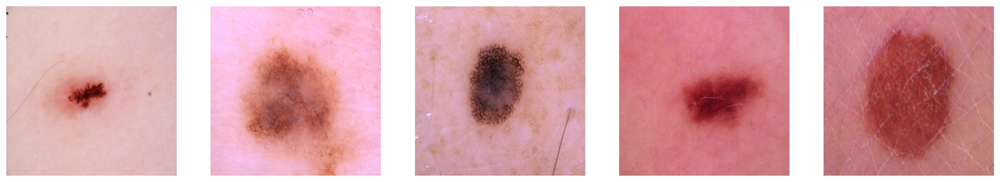

In [3]:
skinDataUtils.PrintMarkdownText('***Samples of the malignant (cancerous) tumors...***')
skinDataUtils.ReadAndDisplayInputImages(SKIN_CANCER_TUMOR_TYPE.BENIGN.value, 5)

### 2. Benign Images

<br>

***Samples of the benign (non-cancerous) tumors...***

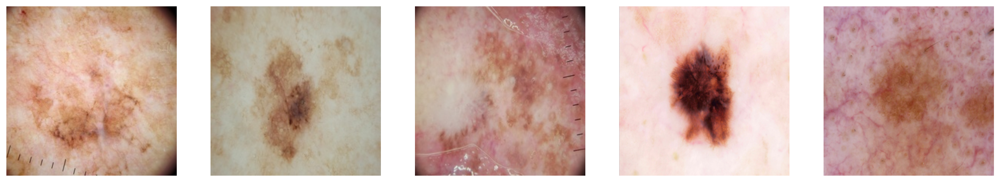

In [4]:
skinDataUtils.PrintMarkdownText('***Samples of the benign (non-cancerous) tumors...***')
skinDataUtils.ReadAndDisplayInputImages(SKIN_CANCER_TUMOR_TYPE.MALIGNANT.value, 5)

### Data Labelling

The images we have are un-labelled data. Deep learnins systems require proper annotated data to be able to learn the specific representations of each class and perform the job on unseen real time data. So, before proceeding with furtehr analysis we will first assign labels to our data. We have 2 class of images -

1. **Benign**

2. **Malignant**

***Malignant (cancerous)*** will be assigned values of 1 and ***Benign (non-cancerous)*** will be assigned the value 0.

In [5]:
skinCancer_df = skinDataUtils.GetLabelledSkinCancerData()

skinDataUtils.PrintMarkdownText('***Labelled skin cancer images...***')
skinCancer_df.head()

<br>

***Labelled skin cancer images...***

,filename,label
0,ISIC Skin Cancer/images/malignant\507.jpg,Malignant
1,ISIC Skin Cancer/images/malignant\1465.jpg,Malignant
2,ISIC Skin Cancer/images/benign\820.jpg,Benign
3,ISIC Skin Cancer/images/benign\311.jpg,Benign
4,ISIC Skin Cancer/images/malignant\1068.jpg,Malignant


In [6]:
skinDataUtils.PrintMarkdownText('***Annotated skin cancer dataframe Info...***')
skinCancer_df.info()

<br>

***Annotated skin cancer dataframe Info...***

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3297 entries, 0 to 3296
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  3297 non-null   object
 1   label     3297 non-null   object
dtypes: object(2)
memory usage: 51.6+ KB


<br>

***Sample Annotated Benign & Malignant Images...***

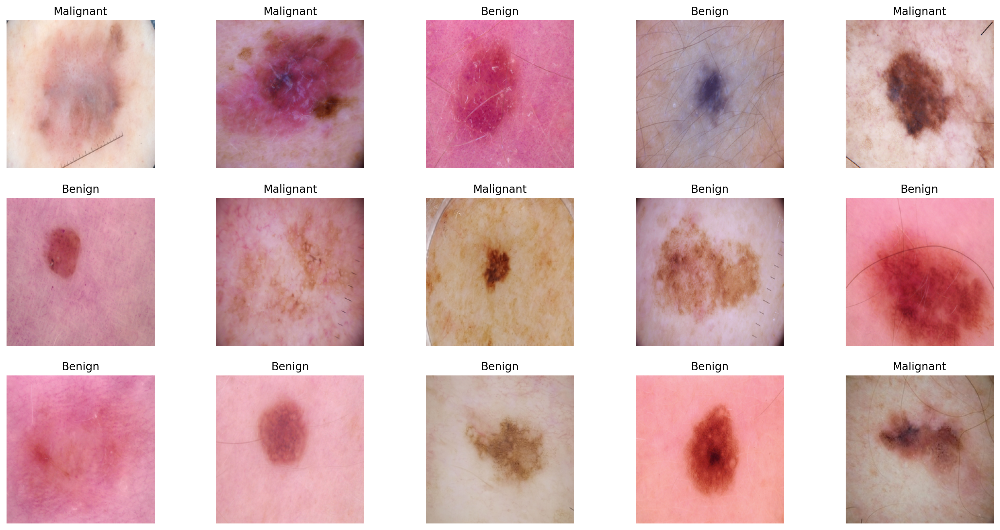

In [7]:
skinDataUtils.PrintMarkdownText('***Sample Annotated Benign & Malignant Images...***')
skinDataUtils.DisplayAnnotatedImages(skinCancer_df, 15)

## Image Dimensions

### 1. Malignant Images

In [8]:
skinDataUtils.PrintMarkdownText('***Shape Distribution for Malignant Images:***')
skinDataUtils.GetAllImageShape(SKIN_CANCER_TUMOR_TYPE.MALIGNANT.value)

<br>

***Shape Distribution for Malignant Images:***

Counter({(224, 224, 3): 1497})

### 2. Benign Images

In [9]:
skinDataUtils.PrintMarkdownText('***Shape Distribution for Benign Images:***')
skinDataUtils.GetAllImageShape(SKIN_CANCER_TUMOR_TYPE.BENIGN.value)

<br>

***Shape Distribution for Benign Images:***

Counter({(224, 224, 3): 1800})

All the images are of uniform dimension --> **(224, 224, 3)**

## Test Train Validation Split

In [10]:
# train - test split
train_files, test_files, train_labels, test_labels = train_test_split(skinCancer_df['filename'].values,
                                                                      skinCancer_df['label'].values, 
                                                                      test_size=0.15, random_state=42)

# train - validation split
train_files, validation_files, train_labels, validation_labels = train_test_split(train_files,
                                                                    train_labels, 
                                                                    test_size=0.10, random_state=42)

In [11]:
skinDataUtils.PrintMarkdownText('***Length of the generated datasets...***')

print(" -- Train Set Length: " + str(len(train_files)) + ' samples'
      "\n -- Validation Set Length: "  + str(len(validation_files)) + ' samples'
      "\n -- Test Set Length: " + str(len(test_files)) + ' samples')

<br>

***Length of the generated datasets...***

 -- Train Set Length: 2521 samples
 -- Validation Set Length: 281 samples
 -- Test Set Length: 495 samples


In [12]:
# Get the Tally of occurrences of the 2 labels in the generated datasets...

skinDataUtils.PrintMarkdownText('***Tally of occurrences of the 2 labels in the generated datasets...***')

print('Training Data:', Counter(train_labels), 
      '\n\nValidation Data:', Counter(validation_labels), 
      '\n\nTest Data:', Counter(test_labels))

<br>

***Tally of occurrences of the 2 labels in the generated datasets...***

Training Data: Counter({'Benign': 1385, 'Malignant': 1136}) 

Validation Data: Counter({'Benign': 164, 'Malignant': 117}) 

Test Data: Counter({'Benign': 251, 'Malignant': 244})


##  Load All Images 
### Train, Test and Validation

In [13]:
# skinDataUtils.ReadAllImages

train_data = skinDataUtils.ReadAllImages(imageList = train_files, resizeImage = True, newImageSize = (135, 135))
validation_data = skinDataUtils.ReadAllImages(imageList = validation_files, resizeImage = True, newImageSize = (135, 135))
test_data = skinDataUtils.ReadAllImages(imageList = test_files, resizeImage = True, newImageSize = (135, 135))

In [14]:
X_test = test_data / 255.

### Label Encoding

Encode categorical values **(`'Benign' & 'Malingant'`)** to convert to the machine readable and interpretable values which would be **Benign - 0** and **Malignant - 1**.

In [15]:
lbl_encoder = LabelEncoder()
lbl_encoder.fit(train_labels)

y_train = lbl_encoder.transform(train_labels)
y_validation = lbl_encoder.transform(validation_labels)
y_test = lbl_encoder.transform(test_labels)

skinDataUtils.PrintMarkdownText('***Categorical & Encoded Training Labels...***')
print("Categorical Train Labels:", list(train_labels[:5]), 
      "\n\nEncoded Train Labels:    ", y_train[:5])

<br>

***Categorical & Encoded Training Labels...***

Categorical Train Labels: ['Benign', 'Malignant', 'Benign', 'Malignant', 'Benign'] 

Encoded Train Labels:     [0 1 0 1 0]


## Swin Transformer Model Training and Validation

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - categorical_accuracy: 0.4396 - loss: 0.9814 - precision: 0.4396 - recall: 0.4396 - val_categorical_accuracy: 0.4164 - val_loss: 0.9026 - val_precision: 0.4164 - val_recall: 0.4164
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.4621 - loss: 0.8360 - precision: 0.4621 - recall: 0.4621 - val_categorical_accuracy: 0.4164 - val_loss: 0.7991 - val_precision: 0.4164 - val_recall: 0.4164
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - categorical_accuracy: 0.4456 - loss: 0.7639 - precision: 0.4456 - recall: 0.4456 - val_categorical_accuracy: 0.4128 - val_loss: 0.7370 - val_precision: 0.4128 - val_recall: 0.4128
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - categorical_accuracy: 0.4371 - loss: 0.7218 - precision: 0.4371 - recall: 0.4371 - val_categorical_accuracy: 0.4342 - val_loss: 0.7055 - val_precision: 0.4342 - val_recall: 0.4342
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - categorical_accurac

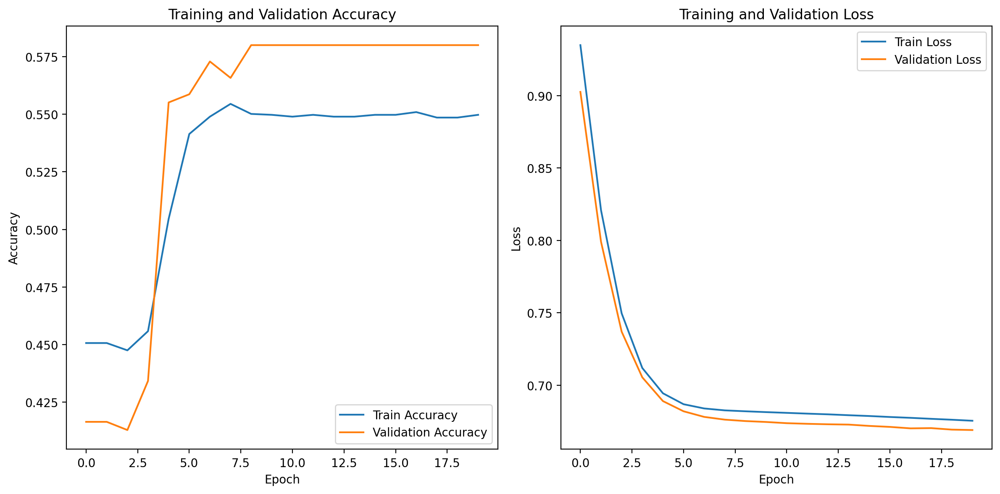

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - categorical_accuracy: 0.5297 - loss: 0.6749 - precision: 0.5297 - recall: 0.5297 
Test Loss: 0.6808
Test Accuracy: 0.5051
Test Precision: 0.5051
Test Recall: 0.5051
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


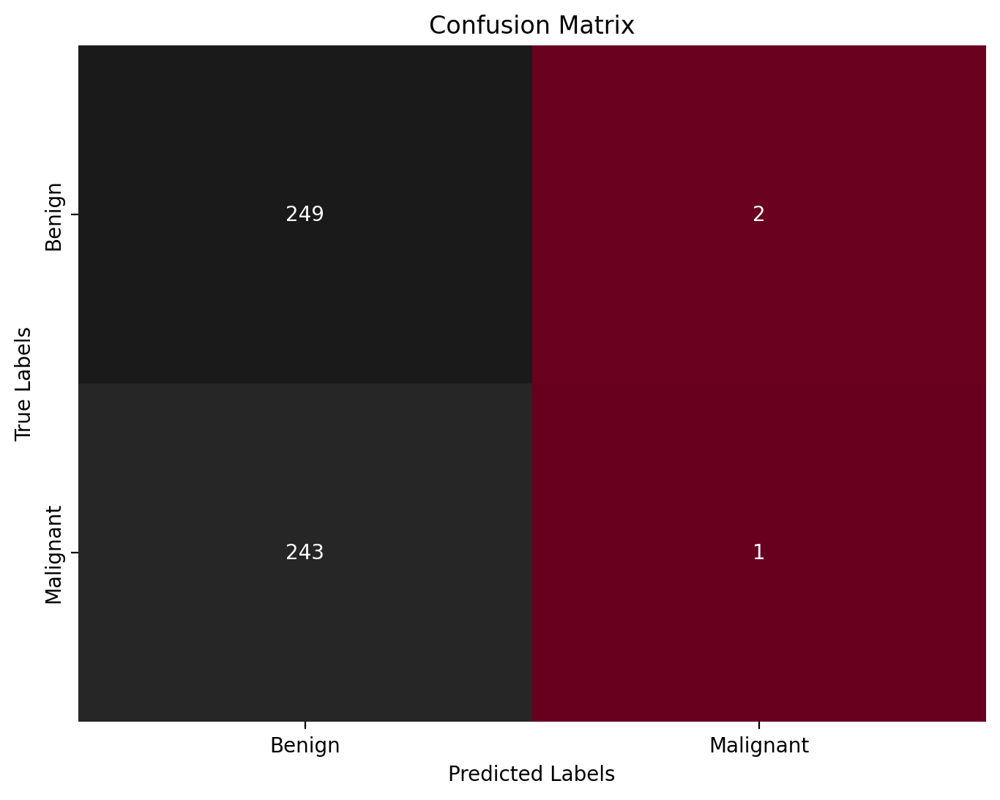

In [16]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import CategoricalAccuracy, Precision, Recall
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Load your image data
train_images = train_data / 255.0  # Normalizing image data
val_images = validation_data / 255.0
test_images = test_data / 255.0

# Step 4: One-hot encode the labels for model training
num_classes = len(lbl_encoder.classes_)  # Number of unique classes
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_validation = tf.keras.utils.to_categorical(y_validation, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# Step 5: Build the Swin Transformer model (simplified version)
def build_swin_transformer(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    # Example: Use GlobalAveragePooling2D for simplicity (replace with Swin layers if available)
    x = GlobalAveragePooling2D()(inputs)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs, outputs)
    return model

# Initialize the model
input_shape = (135, 135, 3)  # Adjust based on your images
swin_transformer = build_swin_transformer(input_shape, num_classes)

# Step 6: Compile the model
swin_transformer.compile(
    optimizer=Adam(),
    loss='categorical_crossentropy',
    metrics=[CategoricalAccuracy(), Precision(), Recall()]
)

# Step 7: Train the model
history = swin_transformer.fit(
    train_images, y_train,
    validation_data=(val_images, y_validation),
    epochs=20,  # Adjust as needed
    batch_size=32  # Adjust as needed
)

# Step 8: Plot training history
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['categorical_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_categorical_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Step 9: Evaluate the model on the test data
test_loss, test_accuracy, test_precision, test_recall = swin_transformer.evaluate(test_images, y_test)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_precision:.4f}')
print(f'Test Recall: {test_recall:.4f}')

# Step 10: Predict on the test data
test_predictions = swin_transformer.predict(test_images)
test_predicted_classes = np.argmax(test_predictions, axis=1)
test_true_classes = np.argmax(y_test, axis=1)

# Step 11: Compute the confusion matrix
cm = confusion_matrix(test_true_classes, test_predicted_classes)

# Step 12: Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='RdGy', cbar=False,
            xticklabels=lbl_encoder.classes_, yticklabels=lbl_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


### Model Testing

In [23]:
y_preds_probability, y_preds_binary = ValidateSkinCancerClassfier.GetModelPredictions(functional_model, X_test)

16/16 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step


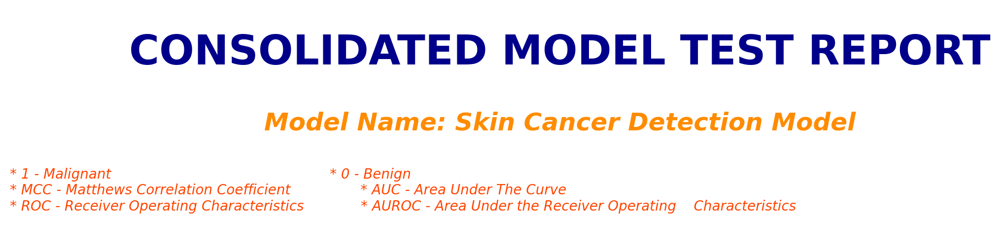

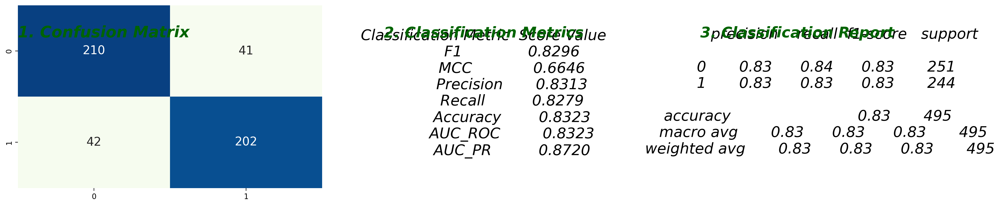

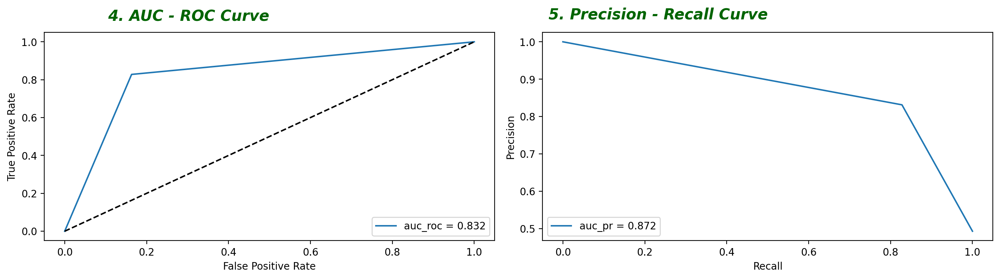

In [24]:
ValidateSkinCancerClassfier.Generate_Model_Test_Classification_Report(y_test, 
                                                                      y_preds_binary, 
                                                                      "Skin Cancer Detection Model")

<br>

***Model test results of 16 random test images...***

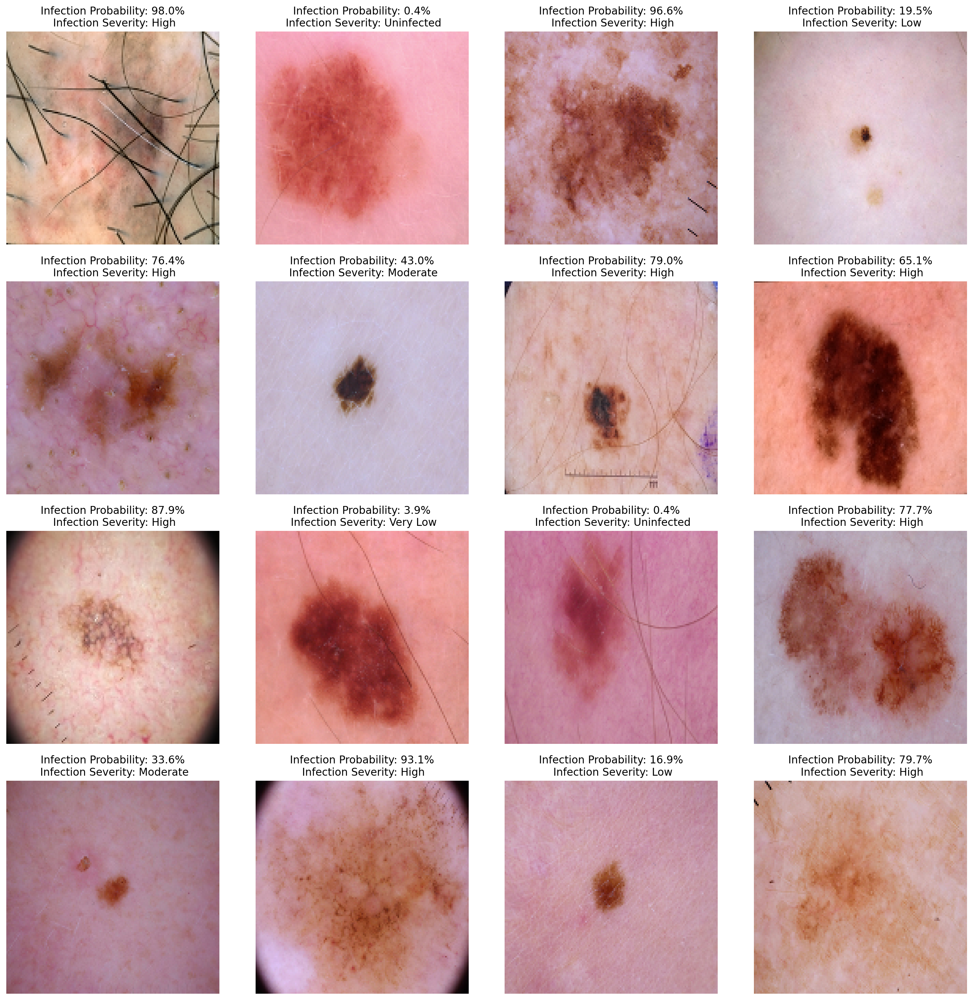

In [25]:
ValidateSkinCancerClassfier.PlotModelPredictionsOnRandomTestImages(X_test, y_test, y_preds_probability)

## Gradient - Class Activation Maps (GradCAM) - Viz

In [26]:
from GradCamUtility import GradCamUtils
gCam = GradCamUtils(functional_model, "block5_conv4")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Probability of the tumor being malignant is: 0.024448277


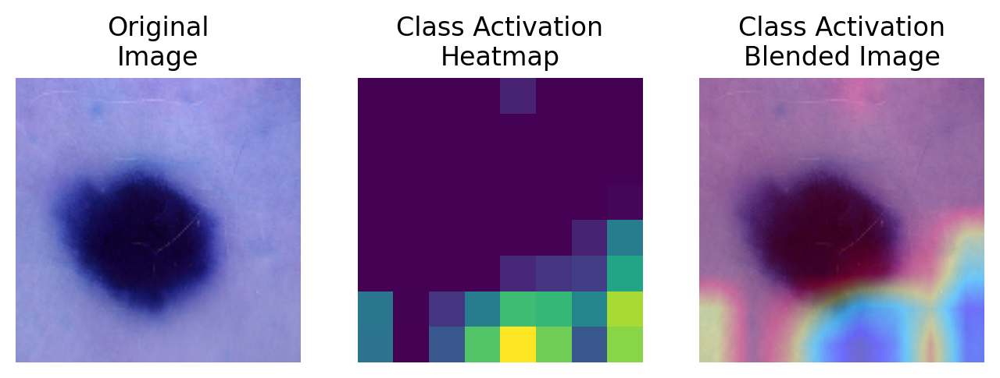

In [27]:
img = cv2.cvtColor(X_test[98], cv2.COLOR_BGR2RGB)
imgAsTensor = np.expand_dims(img, axis=0)

# get the probability of this tumor being malignant
probability = functional_model.predict(imgAsTensor)
print("Probability of the tumor being malignant is:", probability[0][0])

# generate the heatmap
heatmap = gCam.compute_heatmap(imgAsTensor)

# generate the superimposed images and display
superImposedImg = gCam.GetSuperImposedCAMImage(heatmap = heatmap, image = img)
gCam.DisplaySuperImposedImages(image = img, heatmap = heatmap, superimposed_img = superImposedImg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Probability of the tumor being malignant is: 0.15517102


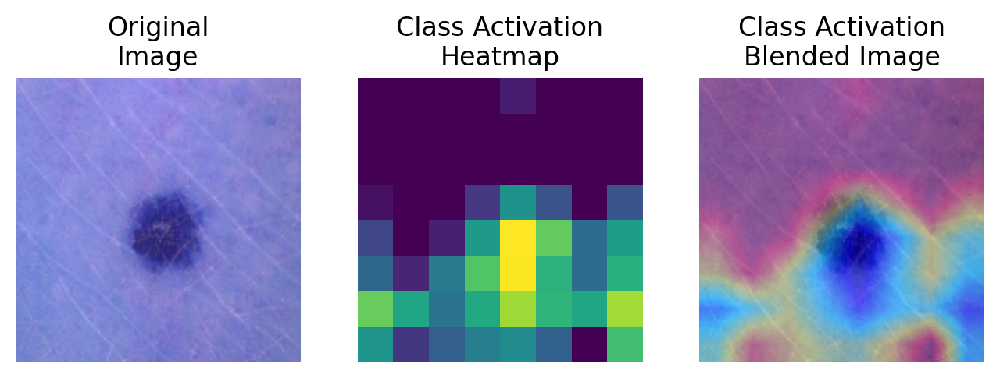

In [28]:
img = cv2.cvtColor(X_test[45], cv2.COLOR_BGR2RGB)
imgAsTensor = np.expand_dims(img, axis=0)

# get the probability of this tumor being malignant
probability = functional_model.predict(imgAsTensor)
print("Probability of the tumor being malignant is:", probability[0][0])

# generate the heatmap
heatmap = gCam.compute_heatmap(imgAsTensor)

# generate the superimposed images and display
superImposedImg = gCam.GetSuperImposedCAMImage(heatmap = heatmap, image = img)
gCam.DisplaySuperImposedImages(image = img, heatmap = heatmap, superimposed_img = superImposedImg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
Probability of the tumor being malignant is: 0.023013363


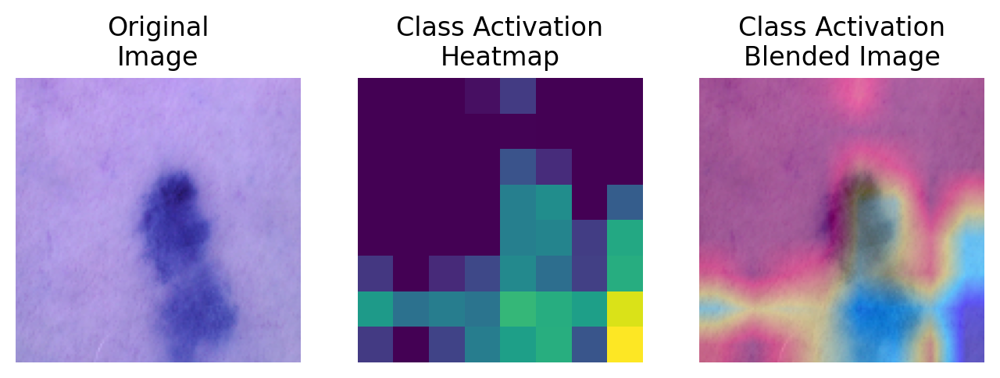

In [29]:
img = cv2.cvtColor(X_test[25], cv2.COLOR_BGR2RGB)
imgAsTensor = np.expand_dims(img, axis=0)

# get the probability of this tumor being malignant
probability = functional_model.predict(imgAsTensor)
print("Probability of the tumor being malignant is:", probability[0][0])

# generate the heatmap
heatmap = gCam.compute_heatmap(imgAsTensor)

# generate the superimposed images and display
superImposedImg = gCam.GetSuperImposedCAMImage(heatmap = heatmap, image = img)
gCam.DisplaySuperImposedImages(image = img, heatmap = heatmap, superimposed_img = superImposedImg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Probability of the tumor being malignant is: 0.80183095


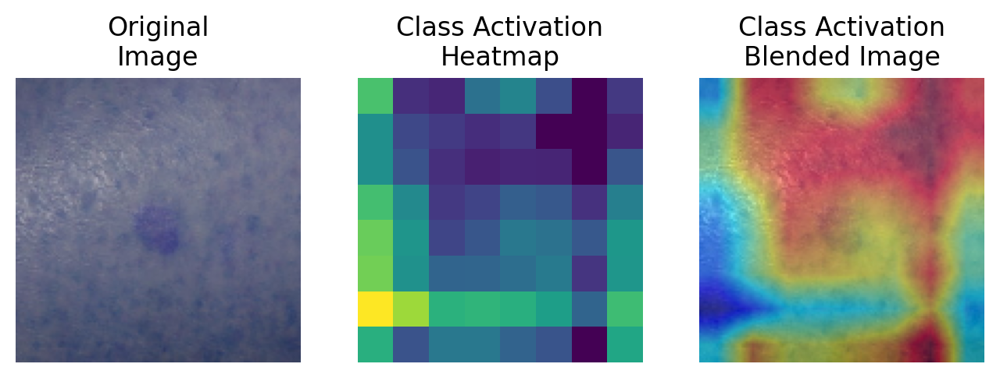

In [30]:
img = cv2.cvtColor(X_test[32], cv2.COLOR_BGR2RGB)
imgAsTensor = np.expand_dims(img, axis=0)

# get the probability of this tumor being malignant
probability = functional_model.predict(imgAsTensor)
print("Probability of the tumor being malignant is:", probability[0][0])

# generate the heatmap
heatmap = gCam.compute_heatmap(imgAsTensor)

# generate the superimposed images and display
superImposedImg = gCam.GetSuperImposedCAMImage(heatmap = heatmap, image = img)
gCam.DisplaySuperImposedImages(image = img, heatmap = heatmap, superimposed_img = superImposedImg)